In [ ]:
import networkx as nx
import pandas as pd
import random

# (1) test.csv 파일을 불러온다
weights_df = pd.read_csv("Project_link_final.csv")

# 가중치 리스트 생성
weights = list(weights_df["WEIGHT"])

# (2) 노드 수와 확률 p를 변수로 지정한다.
num_nodes = 331  # 노드 수
num_egdes = 4851  # 총 엣지 수
p = (num_egdes) / (num_nodes * (num_nodes - 1))  # 엣지 생성 확률


# (3) ER네트워크를 생성한다.
def create_er_network(num_nodes, p, weights):
    G = nx.DiGraph()  # 방향성 있는 그래프 생성
    G.add_nodes_from(range(num_nodes))

    used_weights = []

    for i in range(num_nodes):
        for j in range(num_nodes):
            if i != j and random.random() < p:
                if not weights:
                    # 모든 가중치를 사용했다면 리셋
                    weights = used_weights
                    used_weights = []

                # 가중치 랜덤 선택 및 사용
                weight = random.choice(weights)
                weights.remove(weight)
                used_weights.append(weight)

                G.add_edge(i, j, weight=weight)

    return G


# 네트워크 생성
G = create_er_network(num_nodes, p, weights)


# (4) 엣지리스트를 csv파일로 저장한다.
def save_network_to_csv(G, filename):
    # in-degree 혹은 out-degree가 0인 노드가 있는지 확인
    for node in G.nodes():
        if G.in_degree(node) == 0 or G.out_degree(node) == 0:
            print("경로가 없는 경로가 있음")
            return
    # Save the graph as an edge list with weights
    nx.write_edgelist(G, filename, delimiter=",", data=["weight"])


# 네트워크 저장
save_network_to_csv(G, "ER_network_1.csv")


In [ ]:
import networkx as nx
import pandas as pd
import random


# (1) 데이터 불러오기
weights_df = pd.read_csv("Project_link_final.csv")

# 가중치 리스트 생성
weights = list(weights_df["WEIGHT"])

# (2) 노드 수와 확률 p를 변수로 지정
num_nodes = 331  # 노드 수
num_egdes = 4851  # 총 엣지 수
p = (num_egdes) / (num_nodes * (num_nodes - 1))  # 엣지 생성 확률


# (3) ER 네트워크 생성 함수
def create_er_network(num_nodes, p, weights):
    G = nx.DiGraph()  # 방향성 있는 그래프 생성
    G.add_nodes_from(range(num_nodes))

    used_weights = []

    for i in range(num_nodes):
        for j in range(num_nodes):
            if i != j and random.random() < p:
                if not weights:
                    # 모든 가중치를 사용했다면 리셋
                    weights = used_weights
                    used_weights = []

                # 가중치 랜덤 선택 및 사용
                weight = random.choice(weights)
                weights.remove(weight)
                used_weights.append(weight)

                G.add_edge(i, j, weight=weight)

    return G


# (4) 네트워크를 CSV로 저장
def save_network_to_csv(G, filename):
    # in-degree 혹은 out-degree가 0인 노드가 있는지 확인
    for node in G.nodes():
        if G.in_degree(node) == 0 or G.out_degree(node) == 0:
            print(f"{filename}: 경로가 없는 노드가 있음")
            return
    # Save the graph as an edge list with weights
    with open(filename, "w", newline="") as f:
        f.write("source,target,weight\n")
        for u, v, data in G.edges(data=True):
            f.write(f"{u},{v},{data['weight']}\n")


# (5) 10개의 네트워크 생성 및 저장
def create_and_save_multiple_er_networks(num_networks, num_nodes, p, weights, base_filename):
    for i in range(1, num_networks + 1):
        print(f"Generating network {i}...")
        G = create_er_network(num_nodes, p, weights[:])  # 원본 weights를 유지하기 위해 [:] 사용
        filename = f"{base_filename}_{i}.csv"
        save_network_to_csv(G, filename)
        print(f"Network {i} saved as {filename}")


# 실행
create_and_save_multiple_er_networks(50, num_nodes, p, weights, "ER_network")


Generating network 1...
Network 1 saved as ER_network_1.csv


병렬처리 안하고 그대로 10개 샘플로 뽑아내는 코드

In [5]:
import csv
import heapq
import random
import os


def load_network(file_path):
    with open(file_path, "r") as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        edges = [
            (int(source), int(target), float(weight))
            for source, target, weight in reader
        ]
    return edges


def calculate_average_shortest_path(n, edges):
    arr = [[float("inf")] * n for _ in range(n)]
    for s, e, cost in edges:
        arr[s][e] = cost

    total_distance = 0
    path_count = 0

    for start in range(n):
        dist_arr = [float("inf")] * n
        dist_arr[start] = 0
        q = []
        heapq.heappush(q, (0, start))

        while q:
            cur_dist, cur_pos = heapq.heappop(q)
            if dist_arr[cur_pos] < cur_dist:
                continue
            for next_pos in range(n):
                if arr[cur_pos][next_pos] != float("inf"):
                    next_dist = cur_dist + arr[cur_pos][next_pos]
                    if dist_arr[next_pos] > next_dist:
                        dist_arr[next_pos] = next_dist
                        heapq.heappush(q, (next_dist, next_pos))

        for end in range(n):
            if start != end:
                if dist_arr[end] == float("inf"):
                    # If any node is unreachable, return immediately
                    return float("inf")
                total_distance += dist_arr[end]
                path_count += 1

    return total_distance / path_count if path_count > 0 else float("inf")


def attack_networks(network_files, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for network_file in network_files:
        print(f"Processing {network_file}...")
        edges = load_network(network_file)
        n = max(max(s, e) for s, e, _ in edges) + 1  # Determine number of nodes
        average_shortest_paths = []
        x = 0

        # Open a CSV file to write the results for this network
        output_file = os.path.join(output_dir, f"{os.path.basename(network_file).split('.')[0]}_paths.csv")
        with open(output_file, "w", newline="") as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(["Remaining Edges", "Average Shortest Path"])  # Write header

            while True:
                avg_path_length = calculate_average_shortest_path(n, edges)
                average_shortest_paths.append(avg_path_length)
                x += 1
                print(f"Average shortest path({x}): {avg_path_length}")

                # Write the current state to the CSV file
                writer.writerow([len(edges), avg_path_length])

                # Stop if no paths exist
                if avg_path_length == float("inf"):
                    break

                # Randomly remove an edge
                if len(edges) > 1:
                    edges.pop(random.randint(0, len(edges) - 1))
                else:
                    break

        print(f"Finished processing {network_file}. Results saved to {output_file}")


def main():
    # List of ER network files

    network_dir = "ER_random_network"

    network_files = [os.path.join(network_dir, f"ER_network_{i}.csv") for i in range(1, 11)]
    output_dir = os.path.join(network_dir, "attack_results")  # 결과 저장 디렉토리

    attack_networks(network_files, output_dir)


if __name__ == "__main__":
    main()


Processing ER_random_network\ER_network_1.csv...
Average shortest path(1): 1291.671688590882
Average shortest path(2): 1291.7661410025864
Average shortest path(3): 1292.1450700757403
Average shortest path(4): 1292.1450700757403
Average shortest path(5): 1292.4514122296653
Average shortest path(6): 1292.522386481058
Average shortest path(7): 1292.8412292745556
Average shortest path(8): 1292.8412292745556
Average shortest path(9): 1293.601834901603
Average shortest path(10): 1293.64609709513
Average shortest path(11): 1293.64609709513
Average shortest path(12): 1294.2967289593412
Average shortest path(13): 1294.739376788612
Average shortest path(14): 1294.8900136827915
Average shortest path(15): 1294.9821235966501
Average shortest path(16): 1294.9821235966501
Average shortest path(17): 1294.9872414001545
Average shortest path(18): 1295.0270214280322
Average shortest path(19): 1295.0315672293577
Average shortest path(20): 1295.099562905589
Average shortest path(21): 1295.099562905589
Aver

어텍 결과를 바탕으로 어느정도 시행을 해야 신뢰구간 95를 구할 수 있는지 파악하기

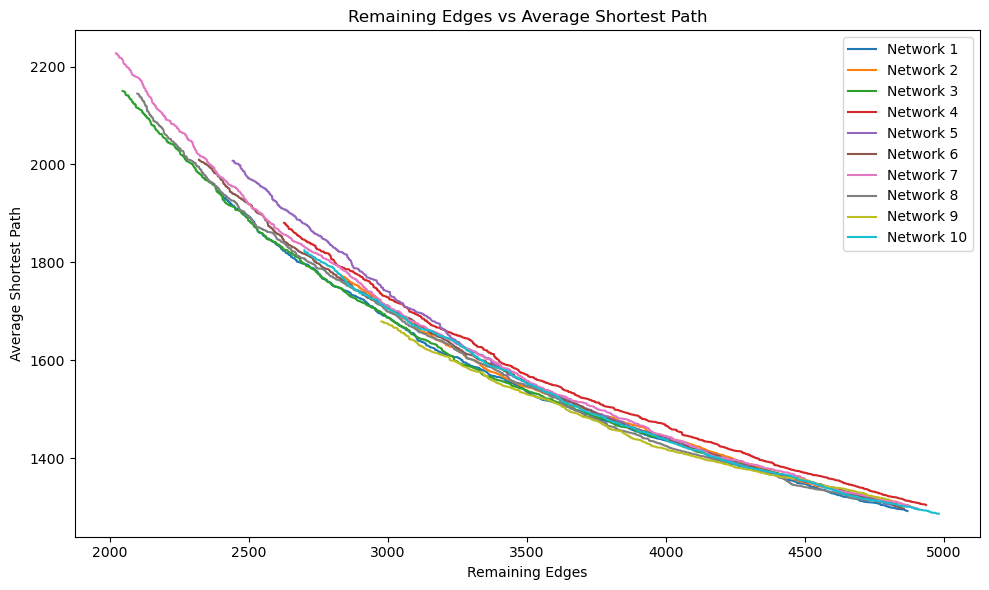

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# CSV 파일들이 있는 디렉토리 경로 설정
directory_path = "./ER_random_network/attack_results/"  # 예: './BA_random_network'

# 10개의 CSV 파일을 읽고 "Remaining Edges"와 "Average Shortest Path" 데이터를 수집
def load_and_plot_data(directory_path, num_files=10):
    plt.figure(figsize=(10, 6))  # 그래프 크기 설정

    for i in range(1, num_files + 1):
        file_name = os.path.join(directory_path, f"ER_network_{i}_paths.csv")
        
        # CSV 파일 읽기
        df = pd.read_csv(file_name)

        # "Remaining Edges"와 "Average Shortest Path" 값을 추출
        remaining_edges = df["Remaining Edges"].tolist()
        avg_shortest_path = df["Average Shortest Path"].tolist()

        # 그래프에 플로팅
        plt.plot(remaining_edges, avg_shortest_path, label=f"Network {i}")

    # 그래프 제목 및 레이블 설정
    plt.title("Remaining Edges vs Average Shortest Path")
    plt.xlabel("Remaining Edges")
    plt.ylabel("Average Shortest Path")
    
    # 범례 표시
    plt.legend()

    # 그래프 보여주기
    plt.tight_layout()
    plt.show()

# 실행
load_and_plot_data(directory_path, num_files=10)


10개의 샘플 데이터를 바탕으로 표준편차를 구해 표본 크기가 얼마나 되어야 하는지 구한다
./ER_random_network/attack_results/

In [1]:
import pandas as pd
import numpy as np
import os
import math

# 파일 경로 (여러 개의 CSV 파일이 있는 디렉토리)
folder_path = "./ER_random_network/attack_results/"  # 예: "/path/to/network_files/"

# 파일 리스트 가져오기
file_names = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# 결과를 저장할 변수
average_shortest_paths = []

# 오차 한계 E 설정 (예: ±5%)
E = 5  # 예: 5% 범위

# Z-값 (95% 신뢰구간)
Z = 1.645

# 각 파일에 대해 데이터를 추출
for file_name in file_names:
    file_path = os.path.join(folder_path, file_name)
    
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 'Average Shortest Path' 열이 있는지 확인
    if 'Average Shortest Path' in df.columns:
        # 'Average Shortest Path' 값을 가져와서 리스트에 추가
        average_shortest_paths.append(df['Average Shortest Path'].tolist())
    else:
        print(f"'{file_name}' 파일에는 'Average Shortest Path' 열이 없습니다.")

# 각 행에 대해 표본 크기 계산
sample_sizes_per_row = []
std_devs_per_row = []

# 각 행에 대해 표본 크기 계산
for row_idx in range(max(len(file_data) for file_data in average_shortest_paths)):  # 최대 길이에 맞춰 반복
    row_values = []

    # 각 파일에서 해당 행(row_idx)에 값이 존재하는 경우만 추가
    for file_idx in range(len(average_shortest_paths)):
        # 파일에 해당 행이 존재할 경우, 그 값을 추가
        if row_idx < len(average_shortest_paths[file_idx]):
            row_values.append(average_shortest_paths[file_idx][row_idx])

    if len(row_values) > 1:  # 표준편차 계산을 위한 유효한 값이 2개 이상일 경우만 계산
        # 각 행의 'Average Shortest Path' 값들의 표준편차 구하기
        row_std_dev = np.std(row_values, ddof=1)  # 표본 표준편차 계산

        # 표본 크기 계산
        n = (Z * row_std_dev / E) ** 2
        #n = math.ceil(n)  # 표본 크기는 정수여야 하므로 반올림

        sample_sizes_per_row.append(n)
        std_devs_per_row.append(row_std_dev)

        # 결과 출력
        print(f"행 {row_idx + 1}: 표준편차 = {row_std_dev:.2f}, 필요한 표본 크기 = {n:.0f}")
    else:
        sample_sizes_per_row.append(np.nan)
        std_devs_per_row.append(np.nan)

# 전체 표본 크기 계산 (최대 표본 크기)
max_sample_size = int(np.nanmax(sample_sizes_per_row))
print(f"\n전체 표본 크기: {max_sample_size}")

# 결과를 DataFrame에 저장
result_df = pd.DataFrame({
    'Row Index': [i + 1 for i in range(len(sample_sizes_per_row))],  # 행 번호 (1부터 시작)
    'Standard Deviation': std_devs_per_row,
    'Sample Size': sample_sizes_per_row
})

# 결과를 CSV 파일로 저장
output_file = "sample_sizes_results.csv"
result_df.to_csv(output_file, index=False)

print(f"결과가 '{output_file}' 파일로 저장되었습니다.")


행 1: 표준편차 = 9.13, 필요한 표본 크기 = 9
행 2: 표준편차 = 9.16, 필요한 표본 크기 = 9
행 3: 표준편차 = 9.06, 필요한 표본 크기 = 9
행 4: 표준편차 = 9.04, 필요한 표본 크기 = 9
행 5: 표준편차 = 9.04, 필요한 표본 크기 = 9
행 6: 표준편차 = 8.96, 필요한 표본 크기 = 9
행 7: 표준편차 = 8.98, 필요한 표본 크기 = 9
행 8: 표준편차 = 8.98, 필요한 표본 크기 = 9
행 9: 표준편차 = 8.97, 필요한 표본 크기 = 9
행 10: 표준편차 = 8.97, 필요한 표본 크기 = 9
행 11: 표준편차 = 8.93, 필요한 표본 크기 = 9
행 12: 표준편차 = 8.88, 필요한 표본 크기 = 9
행 13: 표준편차 = 8.77, 필요한 표본 크기 = 8
행 14: 표준편차 = 8.75, 필요한 표본 크기 = 8
행 15: 표준편차 = 8.71, 필요한 표본 크기 = 8
행 16: 표준편차 = 8.74, 필요한 표본 크기 = 8
행 17: 표준편차 = 8.75, 필요한 표본 크기 = 8
행 18: 표준편차 = 8.74, 필요한 표본 크기 = 8
행 19: 표준편차 = 8.79, 필요한 표본 크기 = 8
행 20: 표준편차 = 8.80, 필요한 표본 크기 = 8
행 21: 표준편차 = 8.84, 필요한 표본 크기 = 8
행 22: 표준편차 = 8.89, 필요한 표본 크기 = 9
행 23: 표준편차 = 8.99, 필요한 표본 크기 = 9
행 24: 표준편차 = 8.96, 필요한 표본 크기 = 9
행 25: 표준편차 = 8.98, 필요한 표본 크기 = 9
행 26: 표준편차 = 8.94, 필요한 표본 크기 = 9
행 27: 표준편차 = 8.93, 필요한 표본 크기 = 9
행 28: 표준편차 = 8.94, 필요한 표본 크기 = 9
행 29: 표준편차 = 8.88, 필요한 표본 크기 = 9
행 30: 표준편차 = 8.87, 필요한 표본 크기 = 9
행 31: 표준편차 = 8.69, 

c:\Users\kname\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\_core\_methods.py:194: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


속도 빠른 버전
ER_random_network 폴더에 들어있는 네트워크들에 대해서 공격을 시행한 데이터들을 ER_random_network_results 에 넣기

In [5]:
import os
from joblib import Parallel, delayed
import heapq
import random
import csv
import time

def load_network(file_path):
    """Load network data from CSV file."""
    with open(file_path, "r") as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        edges = [
            (int(source), int(target), float(weight))
            for source, target, weight in reader
        ]
    return edges

def dijkstra(n, graph, start):
    """Single-source shortest path using Dijkstra's algorithm."""
    distances = [float("inf")] * n
    distances[start] = 0
    queue = [(0, start)]  # (distance, node)

    while queue:
        current_distance, current_node = heapq.heappop(queue)
        if current_distance > distances[current_node]:
            continue

        for neighbor, weight in graph[current_node]:
            distance = current_distance + weight
            if distance < distances[neighbor]:
                distances[neighbor] = distance
                heapq.heappush(queue, (distance, neighbor))
    return distances

def calculate_for_one_node(n, graph, start):
    """Helper function to calculate shortest paths for one node."""
    distances = dijkstra(n, graph, start)
    total_distance = sum(d for d in distances if d < float("inf"))
    reachable_nodes = sum(1 for d in distances if d < float("inf") and d > 0)
    return total_distance, reachable_nodes

def calculate_average_shortest_path_parallel(n, graph):
    """Calculate the average shortest path in parallel."""
    results = Parallel(n_jobs=-1)(
        delayed(calculate_for_one_node)(n, graph, i) for i in range(n)
    )
    total_distance = sum(res[0] for res in results)
    total_paths = sum(res[1] for res in results)
    return total_distance / total_paths if total_paths > 0 else float("inf")

def remove_random_edge(edges, graph):
    """Remove a random edge from the graph."""
    if edges:
        # Remove a random edge
        removed_edge = edges.pop(random.randint(0, len(edges) - 1))
        s, e, _ = removed_edge
        # Remove edge from adjacency list
        graph[s] = [(neighbor, weight) for neighbor, weight in graph[s] if neighbor != e]
    return edges, graph

def process_single_network(file_path, output_folder):
    """Process a single network file."""
    edges = load_network(file_path)
    n = max(max(s, e) for s, e, _ in edges) + 1

    # Build adjacency list
    graph = [[] for _ in range(n)]
    for s, e, weight in edges:
        graph[s].append((e, weight))

    network_name = os.path.basename(file_path).split(".")[0]
    output_file = os.path.join(output_folder, f"{network_name}_average_shortest_paths.csv")

    results = []
    start_time = time.time()
    while edges:
        # Calculate the average shortest path
        avg_path_length = calculate_average_shortest_path_parallel(n, graph)
        results.append((len(edges), avg_path_length))
        print(f"[{network_name}] Remaining edges: {len(edges)}, Average shortest path: {avg_path_length}")

        # Stop if graph is disconnected (infinite shortest path)
        if avg_path_length == float("inf"):
            break

        # Remove a random edge
        edges, graph = remove_random_edge(edges, graph)

    end_time = time.time()

    # Save results to a CSV file
    with open(output_file, "w", newline="") as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["Remaining Edges", "Average Shortest Path"])
        writer.writerows(results)

    print(f"[{network_name}] Total execution time: {end_time - start_time:.2f} seconds")
    print(f"[{network_name}] Results saved to {output_file}")

def main(input_folder, output_folder):
    """Process all network files in the input folder."""
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get list of all CSV files in the input folder
    network_files = [
        os.path.join(input_folder, file)
        for file in os.listdir(input_folder)
        if file.endswith(".csv")
    ]

    for file_path in network_files:
        process_single_network(file_path, output_folder)

# Set input and output folders
input_folder = "ER_random_network"
output_folder = "ER_random_network_results"

# Run the function
main(input_folder, output_folder)


[ER_network_1] Remaining edges: 4869, Average shortest path: 1291.671688590891
[ER_network_1] Remaining edges: 4868, Average shortest path: 1291.671688590891
[ER_network_1] Remaining edges: 4867, Average shortest path: 1291.8030090508648
[ER_network_1] Remaining edges: 4866, Average shortest path: 1291.8670825534998
[ER_network_1] Remaining edges: 4865, Average shortest path: 1291.8670825534998
[ER_network_1] Remaining edges: 4864, Average shortest path: 1291.8670825534998
[ER_network_1] Remaining edges: 4863, Average shortest path: 1291.9704511387463
[ER_network_1] Remaining edges: 4862, Average shortest path: 1292.0808153566522
[ER_network_1] Remaining edges: 4861, Average shortest path: 1292.0860270041298
[ER_network_1] Remaining edges: 4860, Average shortest path: 1292.3221500610614
[ER_network_1] Remaining edges: 4859, Average shortest path: 1292.3668491978121
[ER_network_1] Remaining edges: 4858, Average shortest path: 1292.3886708602606
[ER_network_1] Remaining edges: 4857, Aver

싱글톤이 나오면 멈추도록 하는 코드

In [3]:
import os
from joblib import Parallel, delayed
import heapq
import random
import csv
import time


def load_network(file_path):
    """Load network data from CSV file."""
    with open(file_path, "r") as file:
        reader = csv.reader(file)
        next(reader)  # Skip header
        edges = [
            (int(source), int(target), float(weight))
            for source, target, weight in reader
        ]
    return edges


def dijkstra(n, graph, start):
    """Single-source shortest path using Dijkstra's algorithm."""
    distances = [float("inf")] * n
    distances[start] = 0
    queue = [(0, start)]  # (distance, node)

    while queue:
        current_distance, current_node = heapq.heappop(queue)
        if current_distance > distances[current_node]:
            continue

        for neighbor, weight in graph[current_node]:
            distance = current_distance + weight
            if distance < distances[neighbor]:
                distances[neighbor] = distance
                heapq.heappush(queue, (distance, neighbor))
    return distances


def calculate_for_one_node(n, graph, start):
    """Helper function to calculate shortest paths for one node."""
    distances = dijkstra(n, graph, start)
    total_distance = sum(d for d in distances)
    reachable_nodes = sum(1 for d in distances if d < float("inf") and d > 0)
    return total_distance, reachable_nodes


def calculate_average_shortest_path_parallel(n, graph):
    """Calculate the average shortest path in parallel."""
    results = Parallel(n_jobs=-1)(
        delayed(calculate_for_one_node)(n, graph, i) for i in range(n)
    )
    total_distance = sum(res[0] for res in results)
    total_paths = sum(res[1] for res in results)
    return total_distance / total_paths if total_paths > 0 else float("inf")


def remove_random_edge(edges, graph):
    """Remove a random edge from the graph."""
    if edges:
        # Remove a random edge
        removed_edge = edges.pop(random.randint(0, len(edges) - 1))
        s, e, _ = removed_edge
        # Remove edge from adjacency list
        graph[s] = [
            (neighbor, weight) for neighbor, weight in graph[s] if neighbor != e
        ]
    return edges, graph


def process_single_network(file_path, output_folder):
    """Process a single network file."""
    edges = load_network(file_path)
    n = max(max(s, e) for s, e, _ in edges) + 1

    # Build adjacency list
    graph = [[] for _ in range(n)]
    for s, e, weight in edges:
        graph[s].append((e, weight))

    network_name = os.path.basename(file_path).split(".")[0]
    output_file = os.path.join(
        output_folder, f"{network_name}_average_shortest_paths.csv"
    )

    results = []
    start_time = time.time()

    while edges:
        # Calculate the average shortest path
        avg_path_length = calculate_average_shortest_path_parallel(n, graph)
        results.append((len(edges), avg_path_length))
        print(
            f"[{network_name}] Remaining edges: {len(edges)}, Average shortest path: {avg_path_length}"
        )

        # Stop if graph is disconnected (infinite shortest path)
        if avg_path_length == float("inf"):
            break

        # Remove a random edge
        edges, graph = remove_random_edge(edges, graph)

    end_time = time.time()

    # Save results to a CSV file
    with open(output_file, "w", newline="") as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["Remaining Edges", "Average Shortest Path"])
        writer.writerows(results)

    print(f"[{network_name}] Total execution time: {end_time - start_time:.2f} seconds")
    print(f"[{network_name}] Results saved to {output_file}")


def main(input_folder, output_folder):
    """Process all network files in the input folder."""
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get list of all CSV files in the input folder
    network_files = [
        os.path.join(input_folder, file)
        for file in os.listdir(input_folder)
        if file.endswith(".csv")
    ]

    for file_path in network_files:
        process_single_network(file_path, output_folder)


# Set input and output folders
input_folder = "ER_random_network"
output_folder = "ER_random_network_results"

# Run the function
main(input_folder, output_folder)


[ER_network_1] Remaining edges: 4911, Average shortest path: 1282.9261317869405
[ER_network_1] Remaining edges: 4910, Average shortest path: 1283.0263807550682
[ER_network_1] Remaining edges: 4909, Average shortest path: 1283.026732132459
[ER_network_1] Remaining edges: 4908, Average shortest path: 1283.0341555171804
[ER_network_1] Remaining edges: 4907, Average shortest path: 1283.034971728495
[ER_network_1] Remaining edges: 4906, Average shortest path: 1283.6962394407835
[ER_network_1] Remaining edges: 4905, Average shortest path: 1283.6962394407835
[ER_network_1] Remaining edges: 4904, Average shortest path: 1283.7645498834818
[ER_network_1] Remaining edges: 4903, Average shortest path: 1283.8357075304216
[ER_network_1] Remaining edges: 4902, Average shortest path: 1283.8379902337313
[ER_network_1] Remaining edges: 4901, Average shortest path: 1283.8379902337313
[ER_network_1] Remaining edges: 4900, Average shortest path: 1283.8717120415129
[ER_network_1] Remaining edges: 4899, Aver

아래는 플로이드 알고리즘